## VAEs

### AEs

- Autoencoders are a type of neural network that learns to compress data from high-dimensional space to low-dimensional space and then reconstruct the original data from the compressed data.

- Many resources explain why vanilla autoencoders aren’t good generative models, but the gist is that the latent space is not compact, and there are lots of dead space that produces jargon.

![title](https://miro.medium.com/v2/resize:fit:1400/format:webp/1*2ijh2-e0PcYgYKbWYkbdsw.png)

### Variational AEs

- Variational Inference: 
    - The goal is to approximate the true posterior distribution with a simpler distribution.
    - The true posterior is intractable, so we use a simpler distribution to approximate it.
    - The simpler distribution is parameterized by a neural network.
    - The neural network is trained to minimize the KL divergence between the simpler distribution and the true posterior.

* One main advantage that VAE has over traditional autoencoder is that sampling from the embedded distribution allows the model to generate new data that comes from the same embedding distribution as the input data. Meanwhile, traditional autoencoder can only generate one output similar to its input since its structure is deterministic.

#### Why VAEs?

![title](https://miro.medium.com/v2/resize:fit:878/format:webp/1*8wsxA93n4iLb3cfyzGOi0g.png)

When using generative models, you could simply want to generate a random, new output, that looks similar to the training data, and you can certainly do that too with VAEs. But more often, you’d like to alter, or explore variations on data you already have, and not just in a random way either, but in a desired, specific direction.

#### Problems with AEs

- The fundamental problem with autoencoders, for generation, is that the latent space they convert their inputs to and where their encoded vectors lie, may not be continuous, or allow easy interpolation.

![title](https://miro.medium.com/v2/resize:fit:1400/format:webp/1*-i8cp3ry4XS-05OWPAJLPg.png)


- As seen above --> The latent space is not continuous, and there are lots of dead space that produces jargon. Which is fine if you're just replicating the same images, and just want a model to compress and decompress input data, but not so good if you want to generate new data.

- When building a generative model, you want to be able to sample from the latent space, or generate variations on an input image, from a continuous latent space. 
    - If the space has discontinuities (eg. gaps between clusters) and you sample/generate a variation from there, the decoder will simply generate an unrealistic output, because the decoder has no idea how to deal with that region of the latent space. During training, it never saw encoded vectors coming from that region of latent space.

#### Fix for the Problem --> Make the latent space by design continuous, allowing for easy random sampling and interpolation --> Done by VAEs

-- How? --> by making its encoder not output an encoding vector of size n, rather, outputting two vectors of size n: a vector of means, μ, and another vector of standard deviations, σ.

![title](https://miro.medium.com/v2/resize:fit:1314/format:webp/1*CiVcrrPmpcB1YGMkTF7hzA.png)

#### What does adding stochasticity do? 

- even for the same input, while the mean and standard deviations remain the same, the actual encoding will somewhat vary on every single pass simply due to sampling.

![title](https://miro.medium.com/v2/resize:fit:1400/format:webp/1*96ho7qSyW0nKrLvSoZHOtA.png)

From above:

- In VAEs --> As encodings are generated at random from anywhere inside the “circle” (the distribution), the decoder learns that not only is a single point in latent space referring to a sample of that class, but all nearby points refer to the same as well. This allows the decoder to not just decode single, specific encodings in the latent space (leaving the decodable latent space discontinuous), but ones that slightly vary too, as the decoder is exposed to a range of variations of the encoding of the same input during training

* BUT --> since there are no limits on what values vectors μ and σ can take on, the encoder can learn to generate very different μ for different classes, clustering them apart, and minimize σ, making sure the encodings themselves don’t vary much for the same sample (that is, less uncertainty for the decoder). This allows the decoder to efficiently reconstruct the training data.

![title](https://miro.medium.com/v2/resize:fit:1400/format:webp/1*xCjoga9IPyNUSiz9E7ao7A.png)

Ideal Scenario: encodings, all of which are as close as possible to each other while still being distinct, allowing smooth interpolation, and enabling the construction of new samples.

For this --> KL divergence term is added to the loss function

### Recap

- `Q(z|x)` - Model it as a Neural Network that produces the parameters for the gaussian for an input x. Use the parameters to sample a z --> which becomes the latent representation of x, and the input for another neural network (`P(x|z)`) that will generate the output x.

- Loss Term: Reconstruction Loss + KL Divergence Loss

![title](https://jyopari.github.io/VAE/bad.png)

### Reparameterization Trick

- The issue with te above model --> We can't differentiate through a random node --> We can't backpropogate through the network.

What's the trick? --? Work around the sampling operation, such that the gradients can flow.

* Introduce a new variable `epsilon` which is sampled from a standard normal distribution. Then construct `z` as `mu + sigma * epsilon`. This way, we can backpropogate through `mu` and `sigma` and `epsilon` is just a random variable. 
* Through this you can backpropogate through the network. i.e. we can now compute the partial derivative pf `z` w.r.t `mu` and `sigma` and backpropogate through the network.

![title](https://jyopari.github.io/VAE/good.png)

### Training using only KL Divergence Loss -- What happens?

- If we train the model using only the KL Divergence Loss, the model will learn to ignore the input data and generate random samples from the prior distribution.

![title](https://miro.medium.com/v2/resize:fit:1294/format:webp/1*XdSPoB3rcb7LymviDJBJUg.png)

### Jointly optimizing the KL Divergence Loss and Reconstruction Loss

- Optimizing the two together, however, results in the generation of a latent space which maintains the similarity of nearby encodings on the local scale via clustering, yet globally, is very densely packed near the latent space origin (compare the axes with the original).

![title](https://miro.medium.com/v2/resize:fit:1286/format:webp/1*BIDBG8MQ9-Kc-knUUrkT3A.png)

### In a nutshell:

- Cluster Forming nature --> Reconstruction Loss
- Dense Packing nature --> KL Divergence Loss

So, even when randomly generating, if you sample a vector from the same prior distribution of the encoded vectors, `N(0, I)`, the decoder will successfully decode it. And if you’re interpolating, there are no sudden gaps between clusters, but a smooth mix of features a decoder can understand.

![title](https://miro.medium.com/v2/resize:fit:878/format:webp/1*8wsxA93n4iLb3cfyzGOi0g.png)

How is interpolation on features done? such as generating glasses on a face? --> Vector Arithmetic

- Find two samples, one with glasses, one without, obtain their encoded vectors from the encoder, and save the difference. Add this new “glasses” vector to any other face image, and decode it.

![title](https://miro.medium.com/v2/resize:fit:582/format:webp/1*El2DhlTK5duHyVxVbdqk9Q.png)

In [1]:
import torch; torch.manual_seed(0)
import torch.nn as nn
import torch.nn.functional as F
import torch.utils
import torch.distributions
import torchvision
import numpy as np
import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 200

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [3]:
class Encoder(nn.Module):
    def __init__(self, latent_dims):
        super(Encoder, self).__init__()
        self.linear1 = nn.Linear(784, 512)
        self.linear2 = nn.Linear(512, latent_dims)

    def forward(self, x):
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear1(x))
        return self.linear2(x)

In [4]:
class Decoder(nn.Module):
    def __init__(self, latent_dims):
        super(Decoder, self).__init__()
        self.linear1 = nn.Linear(latent_dims, 512)
        self.linear2 = nn.Linear(512, 784)

    def forward(self, z):
        z = F.relu(self.linear1(z))
        z = torch.sigmoid(self.linear2(z))
        return z.reshape((-1, 1, 28, 28))

In [5]:
class Autoencoder(nn.Module):
    def __init__(self, latent_dims):
        super(Autoencoder, self).__init__()
        self.encoder = Encoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z)

In [6]:
from tqdm import tqdm
def train(autoencoder, data, epochs=20):
    opt = torch.optim.Adam(autoencoder.parameters())
    for epoch in tqdm(range(epochs), total=epochs):
        for x, y in data:
            x = x.to(device) # GPU
            opt.zero_grad()
            x_hat = autoencoder(x)
            loss = ((x - x_hat)**2).sum()
            loss.backward()
            opt.step()
    return autoencoder

In [7]:
def test(autoencoder, data):
    reconstruction_loss = 0
    for x, y in data:
        x = x.to(device) # GPU
        x_hat = autoencoder(x)
        reconstruction_loss += ((x - x_hat)**2).sum().item()
    
    return reconstruction_loss / len(data.dataset)

In [8]:
latent_dims = 2
autoencoder = Autoencoder(latent_dims).to(device) # GPU

data = torch.utils.data.DataLoader(
        torchvision.datasets.MNIST('/projectnb/ds598/admin/xthomas/sp2024_notebooks/discussion/tmp',
               transform=torchvision.transforms.ToTensor(),
               download=True, train=True),
        batch_size=128,
        shuffle=True)

test_data = torch.utils.data.DataLoader(
        torchvision.datasets.MNIST('/projectnb/ds598/admin/xthomas/sp2024_notebooks/discussion/tmp',
               transform=torchvision.transforms.ToTensor(),
               download=True, train=False),
        batch_size=128,
        shuffle=True)

autoencoder = train(autoencoder, data)
test_reconstruction_loss = test(autoencoder, test_data)
print(f'Test reconstruction loss: {test_reconstruction_loss:.4f}')

100%|██████████| 20/20 [04:09<00:00, 12.46s/it]


Test reconstruction loss: 31.8062


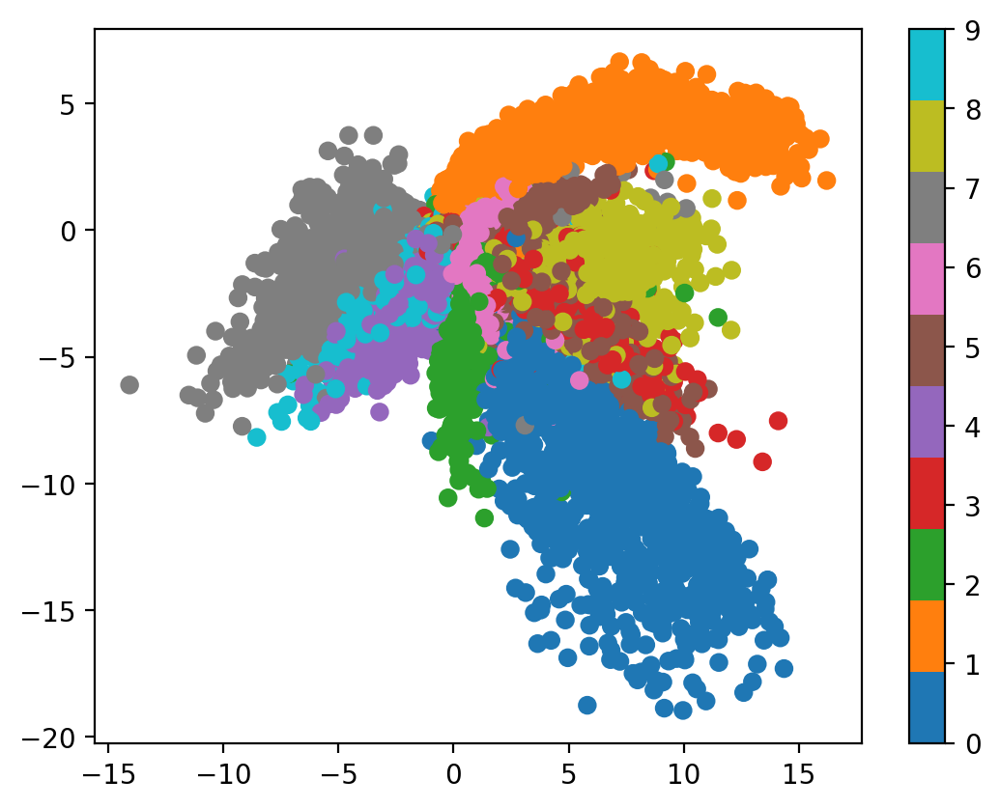

In [9]:
def plot_latent(autoencoder, data, num_batches=100):
    for i, (x, y) in enumerate(data):
        z = autoencoder.encoder(x.to(device))
        z = z.to('cpu').detach().numpy()
        plt.scatter(z[:, 0], z[:, 1], c=y, cmap='tab10')
        if i > num_batches:
            plt.colorbar()
            break

plot_latent(autoencoder, data)

In [10]:
class VariationalEncoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalEncoder, self).__init__()
        self.linear1 = nn.Linear(784, 512)
        self.linear2 = nn.Linear(512, latent_dims)
        self.linear3 = nn.Linear(512, latent_dims)

        self.N = torch.distributions.Normal(0, 1)
        self.kl = 0

    def forward(self, x):
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear1(x))
        mu =  self.linear2(x)
        sigma = torch.exp(self.linear3(x))
        z = mu + sigma*self.N.sample(mu.shape)
        self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()
        return z

In [11]:
class VariationalAutoencoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalAutoencoder, self).__init__()
        self.encoder = VariationalEncoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z)

In [12]:
def train(autoencoder, data, epochs=20):
    opt = torch.optim.Adam(autoencoder.parameters())
    for epoch in tqdm(range(epochs), total=epochs):
        for x, y in data:
            x = x.to(device) # GPU
            opt.zero_grad()
            x_hat = autoencoder(x)
            loss = ((x - x_hat)**2).sum() + autoencoder.encoder.kl
            loss.backward()
            opt.step()
    return autoencoder

In [13]:
vae = VariationalAutoencoder(latent_dims).to(device) # GPU
vae = train(vae, data)

100%|██████████| 20/20 [03:17<00:00,  9.86s/it]


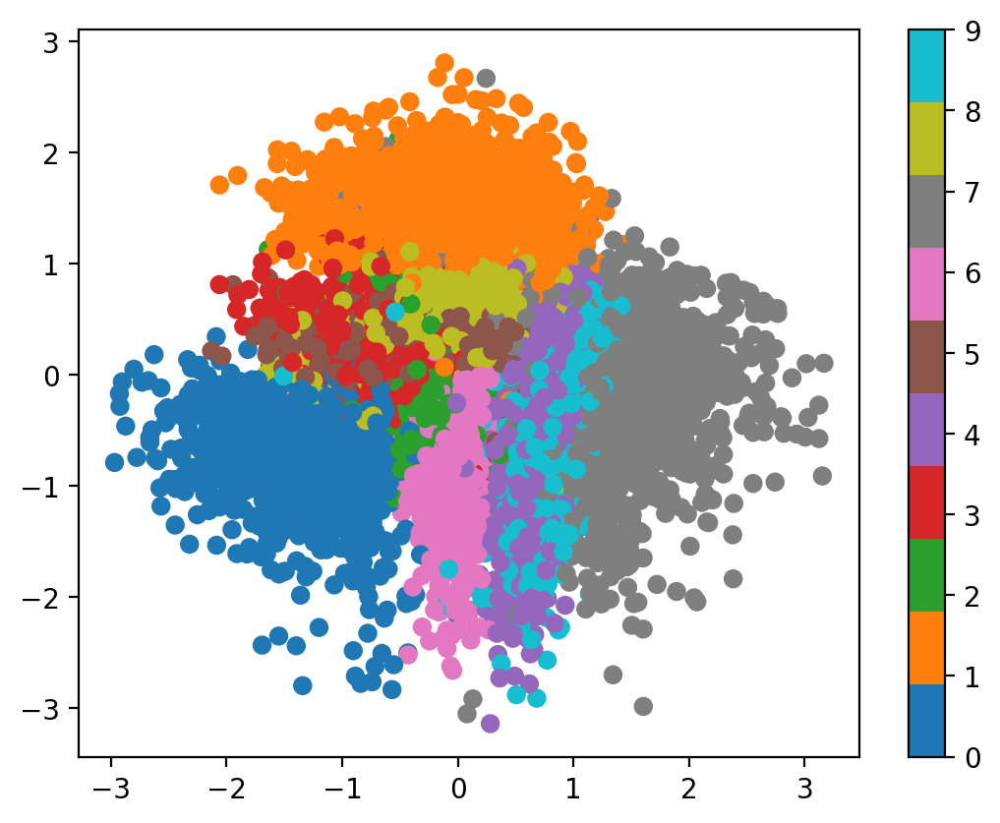

In [14]:
plot_latent(vae, data)

In [15]:
def interpolate(autoencoder, x_1, x_2, n=12):
    z_1 = autoencoder.encoder(x_1)
    z_2 = autoencoder.encoder(x_2)
    z = torch.stack([z_1 + (z_2 - z_1)*t for t in np.linspace(0, 1, n)])
    interpolate_list = autoencoder.decoder(z)
    interpolate_list = interpolate_list.to('cpu').detach().numpy()

    w = 28
    img = np.zeros((w, n*w))
    for i, x_hat in enumerate(interpolate_list):
        img[:, i*w:(i+1)*w] = x_hat.reshape(28, 28)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

In [16]:
x, y = next(iter(data))
x_1 = x[y == 1][1].to(device) # find a 1
x_2 = x[y == 0][1].to(device) # find a 0

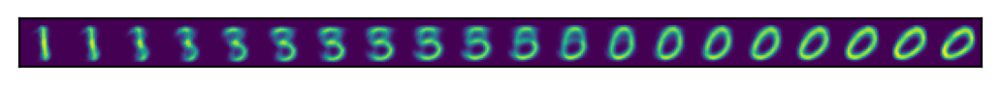

In [17]:
interpolate(vae, x_1, x_2, n=20)

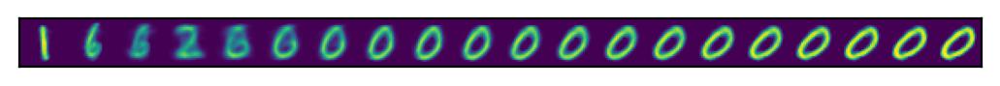

In [18]:
interpolate(autoencoder, x_1, x_2, n=20)

In [19]:
from PIL import Image
from IPython.display import Image as IPythonImage

def interpolate_gif(autoencoder, filename, x_1, x_2, n=100):
    z_1 = autoencoder.encoder(x_1)
    z_2 = autoencoder.encoder(x_2)

    z = torch.stack([z_1 + (z_2 - z_1)*t for t in np.linspace(0, 1, n)])

    interpolate_list = autoencoder.decoder(z)
    interpolate_list = interpolate_list.to('cpu').detach().numpy()*255

    images_list = [Image.fromarray(img.reshape(28, 28)).resize((256, 256)) for img in interpolate_list]
    images_list = images_list + images_list[::-1] # loop back beginning

    images_list[0].save(
        f'{filename}.gif',
        save_all=True,
        append_images=images_list[1:],
        loop=1)

    return IPythonImage(filename=f'{filename}.gif')

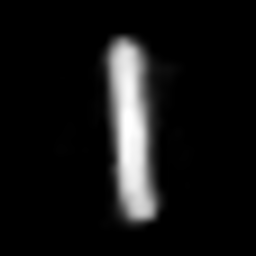

In [20]:
gif = interpolate_gif(autoencoder, "ae", x_1, x_2)
gif

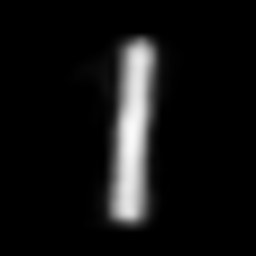

In [21]:
gif = interpolate_gif(vae, "vae", x_1, x_2)
gif

Ref:    
https://jyopari.github.io/VAE.html    
https://towardsdatascience.com/intuitively-understanding-variational-autoencoders-1bfe67eb5daf
